<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Task-Summery" data-toc-modified-id="Task-Summery-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Task Summery</a></span></li><li><span><a href="#Data-preprocessing" data-toc-modified-id="Data-preprocessing-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data preprocessing</a></span></li><li><span><a href="#Class-definition" data-toc-modified-id="Class-definition-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Class definition</a></span></li><li><span><a href="#Feature-Engineering" data-toc-modified-id="Feature-Engineering-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Feature Engineering</a></span></li><li><span><a href="#Data-splitting" data-toc-modified-id="Data-splitting-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Data splitting</a></span></li><li><span><a href="#Model-definition" data-toc-modified-id="Model-definition-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Model definition</a></span></li><li><span><a href="#Plot-class" data-toc-modified-id="Plot-class-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Plot class</a></span></li><li><span><a href="#Model-hyperparameter-optimisation" data-toc-modified-id="Model-hyperparameter-optimisation-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Model hyperparameter optimisation</a></span></li><li><span><a href="#Model-interpretation" data-toc-modified-id="Model-interpretation-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Model interpretation</a></span></li></ul></div>

## Task Summery

To predict the likelihood of a customer defaulting of a loan, based on customer EFTOS money transactions,

In [3]:
#Basic libraries
import pandas as pd
import numpy as np
import datetime

#Graphic libraries
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
#Quick EDA
import pandas_profiling
import missingno as msno

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

import plotly.graph_objects as go

import seaborn as sns
import catboost

import category_encoders as ce

#### Classifiers class
from sklearn import svm
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb
from sklearn.metrics import f1_score, roc_curve, roc_auc_score, precision_recall_curve, auc
from sklearn.metrics import confusion_matrix, mean_absolute_error,accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline

import plotly.express as px

# import sklearn
# sklearn.metrics.SCORERS.keys()

import shap
shap.initjs()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Data preprocessing

In [4]:
customer_df = pd.read_csv('../data/customer_start_terminate.csv', parse_dates=['startDate', 'firstTransactionDate', 'terminatedDate'])
transaction_df = pd.read_csv('../data/transactions_customer.csv', parse_dates=['date'])
customer_df['terminatedDate'] = pd.to_datetime(customer_df['terminatedDate'].dt.date)
customer_df['Tenure'] = (customer_df.terminatedDate - customer_df.startDate).astype('timedelta64[D]')

# transaction_df['year'] = transaction_df.date.dt.year
# transaction_df['month'] = transaction_df.date.dt.month
# transaction_df = transaction_df.groupby(['customer_id', 'industry', 'location', ''])

data_df = transaction_df.merge(customer_df, on='customer_id', how='left')
data_df['year'] = data_df.date.dt.year
data_df['month'] = data_df.date.dt.month

display(customer_df.head(), transaction_df.head())
display(data_df.head())
print('No of customers in customer_df: {}'.format(len(customer_df.customer_id.unique())))
print('No of customers in transaction_df: {}'.format(len(transaction_df.customer_id.unique())))
print('No of customers in data_df: {}'.format(len(data_df.customer_id.unique())))

,customer_id,startDate,firstTransactionDate,terminatedDate,Tenure
0,70efdf2ec9b086079795c442636b55fb,2006-10-19,2006-10-19,NaT,NaN
1,b6d767d2f8ed5d21a44b0e5886680cb9,2006-10-26,2006-10-26,NaT,NaN
2,6ea9ab1baa0efb9e19094440c317e21b,2006-10-26,2006-10-26,NaT,NaN
3,f033ab37c30201f73f142449d037028d,2006-10-26,2006-10-26,2013-02-07,2296.0
4,92cc227532d17e56e07902b254dfad10,2006-10-26,2006-10-26,2013-05-07,2385.0


,date,customer_id,industry,location,monthly_amount,daily_average_amount,daily_sd_amount
0,2013-01-01,c81e728d9d4c2f636f067f89cc14862c,2,1,0.00,0.000000,0.000000
1,2013-01-02,c81e728d9d4c2f636f067f89cc14862c,2,1,1.10,0.157143,0.345821
2,2013-01-03,c81e728d9d4c2f636f067f89cc14862c,2,1,0.00,0.000000,0.000000
3,2013-01-04,c81e728d9d4c2f636f067f89cc14862c,2,1,19.49,1.299333,2.651994
4,2013-01-05,c81e728d9d4c2f636f067f89cc14862c,2,1,0.00,0.000000,0.000000


,date,customer_id,industry,location,monthly_amount,daily_average_amount,daily_sd_amount,startDate,firstTransactionDate,terminatedDate,Tenure,year,month
0,2013-01-01,c81e728d9d4c2f636f067f89cc14862c,2,1,0.00,0.000000,0.000000,NaT,NaT,NaT,NaN,2013,1
1,2013-01-02,c81e728d9d4c2f636f067f89cc14862c,2,1,1.10,0.157143,0.345821,NaT,NaT,NaT,NaN,2013,1
2,2013-01-03,c81e728d9d4c2f636f067f89cc14862c,2,1,0.00,0.000000,0.000000,NaT,NaT,NaT,NaN,2013,1
3,2013-01-04,c81e728d9d4c2f636f067f89cc14862c,2,1,19.49,1.299333,2.651994,NaT,NaT,NaT,NaN,2013,1
4,2013-01-05,c81e728d9d4c2f636f067f89cc14862c,2,1,0.00,0.000000,0.000000,NaT,NaT,NaT,NaN,2013,1


No of customers in customer_df: 1716
No of customers in transaction_df: 627
No of customers in data_df: 627


In [5]:
transaction_df.columns

Index(['date', 'customer_id', 'industry', 'location', 'monthly_amount',
       'daily_average_amount', 'daily_sd_amount'],
      dtype='object')

In [6]:
_ = customer_df.sort_values('startDate').groupby(['startDate']).size().reset_index()
_.rename(columns={0:'Count'}, inplace=True)
px.line(
    _, x="startDate", y="Count", template="plotly_white",
    labels=dict(Count="Counts"), 
    width=800, height=400, title="startDate"
)

In [7]:
_ = customer_df.sort_values('terminatedDate').groupby(['terminatedDate']).size().reset_index()
_.rename(columns={0:'Count'}, inplace=True)
fig = px.line(
    _, x="terminatedDate", y="Count", template="plotly_white",
    labels=dict(Count="Counts"), 
    width=800, height=400, title="endDate, 780 terminated, 521 in 13-02-07"
)
fig.show()

In [8]:
fig = px.histogram(customer_df, x="Tenure", marginal="rug", title='Tenure max=3990, min=1162 days')
fig.show()

In [9]:
fig = px.line(transaction_df, x="date", y="daily_average_amount", color='customer_id', hover_data=['location', 'industry'])
fig.update_layout(showlegend=False)
fig.show()

In [10]:
x = '23755432da68528f115c9633c0d7834f'
_ = data_df[data_df.terminatedDate.isnull()][data_df.customer_id!=x]
fig = px.line(_, x="date", y="monthly_amount", color='customer_id', title='monthly amount')
fig.update_layout(showlegend=False)
fig.show()

## Class definition

In [11]:
# The hyposthisis is that customers who terminated contrats are defaulted customers (class 1).
data_df['class'] = ~data_df.terminatedDate.isnull()
data_df['class'] = data_df['class'].astype(int)

## Feature Engineering

In [12]:
lags = 5
final_df = data_df.copy()
final_df = final_df.sort_values(by='date')
_ = final_df.groupby('customer_id')

for l in range(1, lags):
    final_df['monthly_amount_{}'.format(l)] = _['monthly_amount'].shift(l)
    final_df['daily_average_amount_{}'.format(l)] = _['daily_average_amount'].shift(l)
    final_df['daily_sd_amount_{}'.format(l)] = _['daily_sd_amount'].shift(l)
    
final_df = final_df.groupby('customer_id').tail(1)
print('No of customers in data_df: {}'.format(len(final_df.customer_id.unique())))

No of customers in data_df: 627


In [13]:
final_df.columns

Index(['date', 'customer_id', 'industry', 'location', 'monthly_amount',
       'daily_average_amount', 'daily_sd_amount', 'startDate',
       'firstTransactionDate', 'terminatedDate', 'Tenure', 'year', 'month',
       'class', 'monthly_amount_1', 'daily_average_amount_1',
       'daily_sd_amount_1', 'monthly_amount_2', 'daily_average_amount_2',
       'daily_sd_amount_2', 'monthly_amount_3', 'daily_average_amount_3',
       'daily_sd_amount_3', 'monthly_amount_4', 'daily_average_amount_4',
       'daily_sd_amount_4'],
      dtype='object')

In [14]:
per_customer = data_df.groupby(['customer_id', 'class'])['daily_sd_amount','monthly_amount', 'daily_average_amount', 'Tenure'].mean().reset_index()
fig = px.histogram(per_customer, x="monthly_amount", marginal="rug", hover_data=per_customer.columns, color="class")
fig.show()

In [15]:
features = final_df.columns.difference(['date', 'customer_id', 'startDate',
       'firstTransactionDate', 'terminatedDate', 'Tenure', 'startOffset',
       'endOffset'])

cat_features = ['industry', 'location']
final_df = final_df[features].dropna()

In [16]:
hot_encoder = ce.OneHotEncoder(cols=cat_features)
final_df = hot_encoder.fit_transform(final_df)

In [17]:
_ = final_df['class'].value_counts().to_frame("Count").reset_index().dropna()
_['index'] = _['index'].replace(True, 'Defaulted').replace(False, 'Non Defaulted')
_ = _.rename(columns={'index':'class'})
px.bar(
    _, x="class", y="Count", template="plotly_white",
    labels=dict(Count="Counts"), 
    width=800, height=400, title="Number of Defaulting Customers", color='class'
)

## Data splitting

In [18]:
from sklearn.model_selection import train_test_split

def random_create_data(df, trgt='class'):
    
    X = df[df.columns.difference([trgt])]
    y = df[trgt]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
        
    return X_train, X_test, y_train, y_test

## Model definition

In [19]:
class Classifier(object):
    
    
    classifier = {'LogisticRegression':LogisticRegression(),
                  'XGBoost':xgb.XGBClassifier(),
                  'SVM': svm.SVC(),
                  'RandomForestClassifier': RandomForestClassifier()}
    
    
    #Classifier initial parameters
    clfr_init_param = {'LogisticRegression':{'random_state':42, 
                                             
                                             'max_iter':5
                                             }, 
                       'XGBoost': {'objective':'binary:logistic', 
                                   'max_delta_step': 1, 
                                   'random_state':42, 
                                   'min_child_weight':1},
                       'SVM': {'kernel': 'rbf', 
                               'class_weight':'balanced', 
                               'random_state':42},
                       'RandomForestClassifier': {'random_state':42}
                      }
    
    #Classifier tunning parameters
    clfr_tune_param = {'LogisticRegression':{'C':[0.005, 0.01, 0.1, 1.], 
                                             'penalty':['l1', 'l2'],
                                             'class_weight':[{1:10,0:1},{1:1,0:1}, 'balanced']
                                            },

                       'SVM': {'C':[0.005, 0.01, 0.1], 
                               'gamma':[0.001, 0.01, 0.1, 1]},
                       
                       'RandomForestClassifier': {'bootstrap': [True, False],
                                                  'max_depth': [10, 20, 30],
                                                  'max_features': ['auto', 'sqrt'],
                                                  'min_samples_leaf': [1, 2, 4],
                                                  'min_samples_split': [2, 5, 10],
                                                  'n_estimators': [200, 600, 800, 1000, 1200]},
                        'XGBoost':{
                                    'learning_rate': (0.001, 0.1, 'log-uniform'),
                                    'max_depth': (2, 10),
                                    'subsample': (0.1, 1.0, 'uniform'),
                                    'colsample_bytree': (0.1, 1.0, 'uniform'),
                                    'n_estimators': (100, 2000),
                                    'gamma': (0, 10., 'uniform')
                                    }
                      }
                           
    def __init__(self, name):
        self.name = name
        self.tune_param = {'clsfr__'+k: v for k,v in self.clfr_tune_param[name].items()}
        self.model = self.classifier[name].set_params(**self.clfr_init_param[name])   

## Plot class

In [20]:
#Plot class
class Plot:
    
    def __init__(self):
        pass
    
    @staticmethod  
    def plot_auc(y_test, y_pred_prob):
       
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        plt.plot([0, 1], [0, 1], linestyle='--')
        plt.plot(fpr, tpr, marker='.')
        plt.show()
        auc_score = roc_auc_score(y_test, y_pred_prob)
        print('AUC: %.3f' % auc_score)
    
    @staticmethod
    def plot_precision_recall(y_test, y_pred_prob):
        
        precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob) 
        plt.title("Precision-Recall vs Threshold Chart")
        plt.plot(thresholds, precision[:-1], "b--", label="Precision")
        plt.plot(thresholds, recall[:-1], "r--", label="Recall")
        plt.ylabel("Precision, Recall")
        plt.xlabel("Threshold")
        plt.legend(loc="lower left")
        plt.ylim([0,1])
        plt.show()

        plt.step(recall, precision, color='b', alpha=0.2,
                 where='post')
        plt.fill_between(recall, precision, alpha=0.2, color='b')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.ylim([0.0, 1.05])
        plt.xlim([0.0, 1.0])
        plt.title('2-class Precision-Recall curve')
        plt.show()
    
    @staticmethod
    def confusion_matrix(y_true, y_pred):
        
        print("Classification Report: \n", classification_report(y_true=y_true, y_pred=y_pred))
        accuracy = accuracy_score(y_true=y_true, y_pred=y_pred)
        print("\nAccuracy",accuracy)
        
        conf_mat = confusion_matrix(y_true=y_true, y_pred=y_pred)
        print('Confusion matrix:\n', conf_mat)

        labels = ['Class 0', 'Class 1']
        fig = plt.figure()
        ax = fig.add_subplot(111)
        cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
        fig.colorbar(cax)
        ax.set_xticklabels([''] + labels)
        ax.set_yticklabels([''] + labels)
        plt.xlabel('Predicted')
        plt.ylabel('Expected')
        plt.show()

## Model hyperparameter optimisation 

In [21]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

#Cross validation
from sklearn.model_selection import StratifiedKFold

cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    )

class HyperTuning(object):
    
    def __init__(self):
        pass
    
    @staticmethod
    def grid_search(name, X_train, y_train):
        clfr = Classifier(name)
        pipe = Pipeline([('clsfr', clfr.model)])

        grid = GridSearchCV(pipe, cv=cv, 
                            param_grid=clfr.tune_param, 
                            iid=True, 
                            scoring='f1_weighted', 
                            verbose=3, 
                            n_jobs=-1,
                            refit=True
                           )

        grid.fit(X_train, y_train)
        
        print('Finished GridSearch')
        
        return grid 
    
    @staticmethod
    def baysian_search(name, X_train, y_train):
        clfr = Classifier(name)
        pipe = Pipeline([('clsfr', clfr.model)])

        opt = BayesSearchCV(
              estimator=pipe,
              scoring='f1',
              search_spaces = [(clfr.tune_param, 5)], # (parameter space, # of evaluations)
              cv=cv,
              verbose = True,
              n_jobs = -1,
              refit = True,
              random_state = 42
            )
        opt.fit(X_train, y_train)
        print('Finished Training')
        
        return opt
        
    
    @staticmethod
    def evaluate_opt(opt, X, y):
        print('Best model\n')
        print(opt.best_estimator_)
        print('\n')
        print('Best score on the validation: {}'.format(opt.best_score_))
        result_df = pd.DataFrame(opt.cv_results_)\
          .loc[:,['mean_test_score', 'rank_test_score', 'params']].sort_values(by='rank_test_score')
        print(result_df.head(5))
        print("*******************Training************************")
        print("Best. score: %s" % opt.best_score_)

        y_pred_prob = opt.predict_proba(X['train'])[:,1]
        y_pred = opt.predict(X['train'])
        Plot.confusion_matrix(y['train'], y_pred)

        ##################################
        print("*****************Testing***************************")

        y_pred_prob = opt.predict_proba(X['test'])[:,1]
        y_pred = opt.predict(X['test'])
        Plot.plot_auc(y_test, y_pred_prob)
        Plot.confusion_matrix(y['test'], y_pred)
        Plot.plot_precision_recall(y['test'], y_pred_prob)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.5s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.7s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.2s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.5s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    1.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.6s finished


Finished Training
Best model

Pipeline(memory=None,
         steps=[('clsfr',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1,
                               colsample_bytree=0.8195980974464558, gamma=4,
                               learning_rate=0.011304216699488043,
                               max_delta_step=1, max_depth=8,
                               min_child_weight=1, missing=None,
                               n_estimators=1817, n_jobs=1, nthread=None,
                               objective='binary:logistic', random_state=42,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
                               seed=None, silent=True,
                               subsample=0.7453280360438532))],
         verbose=False)


Best score on the validation: 0.43586838321841226
   mean_test_score  rank_test_score  \
4         0.435868                1   
3         0.427240              

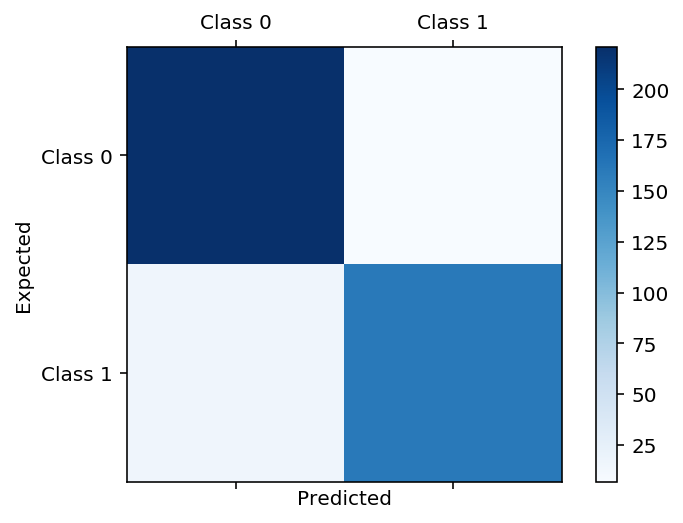

*****************Testing***************************


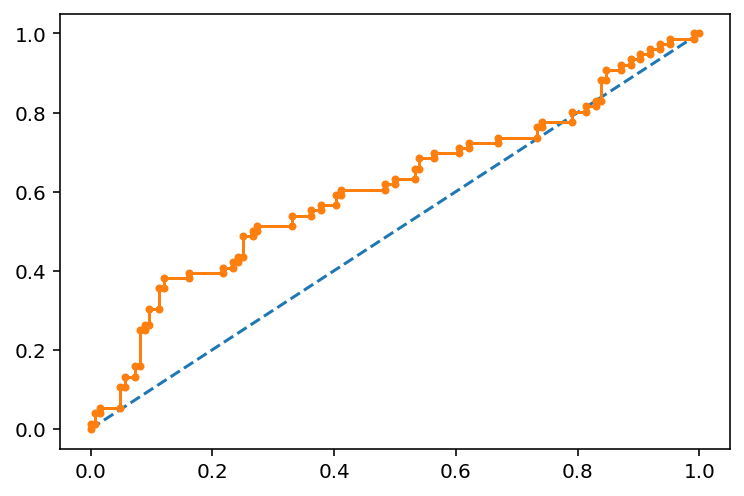

AUC: 0.610
Classification Report: 
               precision    recall  f1-score   support

           0       0.70      0.75      0.72       124
           1       0.54      0.47      0.50        76

    accuracy                           0.65       200
   macro avg       0.62      0.61      0.61       200
weighted avg       0.64      0.65      0.64       200


Accuracy 0.645
Confusion matrix:
 [[93 31]
 [40 36]]


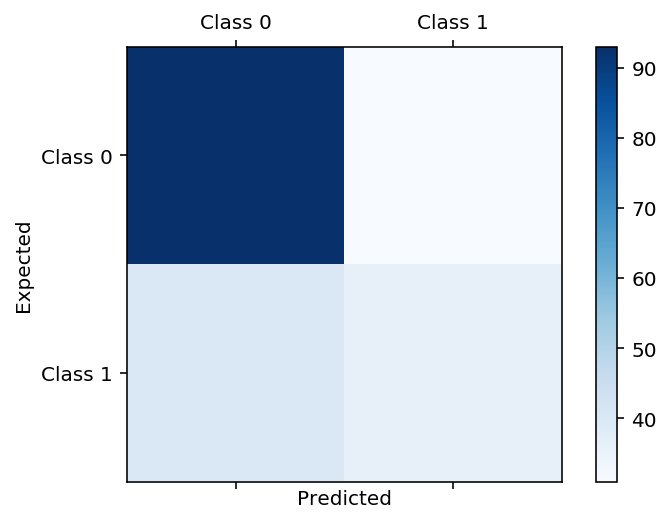

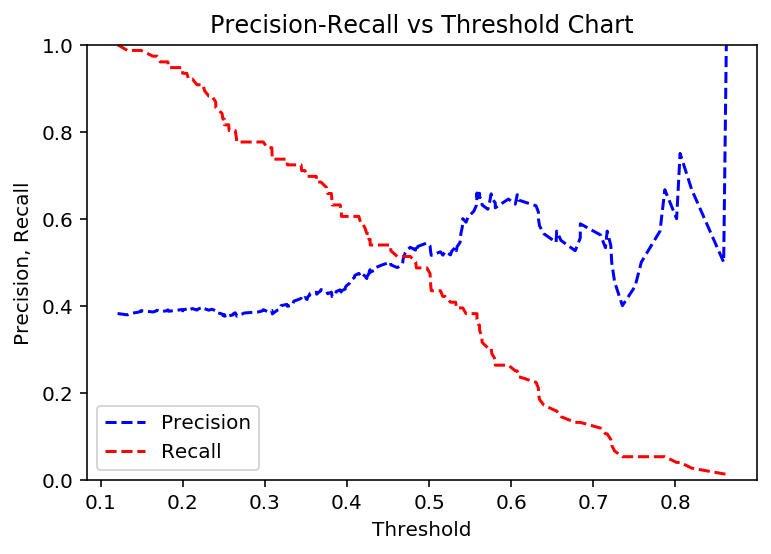

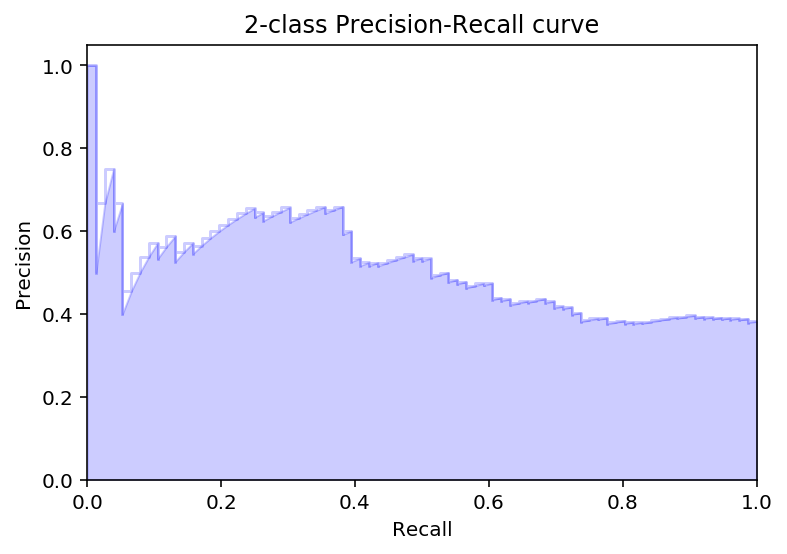

In [22]:
%time 
name = 'XGBoost'
X_train, X_test, y_train, y_test = random_create_data(final_df, trgt='class')

X = {'train': X_train, 'test':X_test}
y = {'train': y_train, 'test':y_test}

opt = HyperTuning.baysian_search(name, X['train'], y['train'])
HyperTuning.evaluate_opt(opt, X, y)

## Model interpretation

In [23]:
import shap
shap.initjs()
# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(opt.best_estimator_['clsfr'])
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

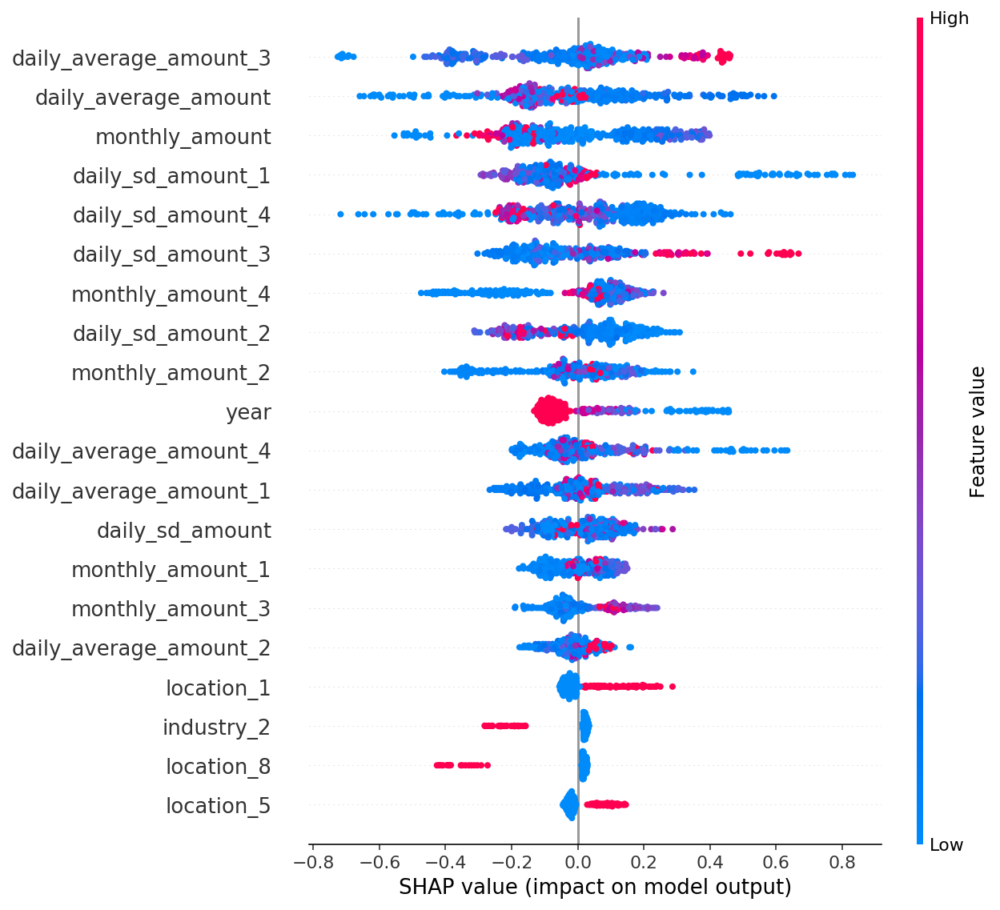

In [24]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_train)